# <center><font color='cyan'>MY 2024-25 SCIENCE FAIR NOTEBOOK</font></center>
## <center><font color='yellow'>MY QUESTION</font></center>
### <center><font color='yellow'>Can a Data Science Approach<br>Offer Additional Insights<br>to the nearly<br>90,000 UFO Sightings<br>in the United States ?</font></center>

# <center> [Thomas Edison and His Papers](https://edison.rutgers.edu/about/thomas-edison-and-his-papers) </center>

## <center> Thomas Edison Created Approximately<br> 3,500 notebooks ...<br>around 285 pages each ...<br>5 million words ...<br>Thousands of sketches ...<br>His notebooks<br>were filled with a variety of content:<br>including diagrams ...<br>calculations ...<br>lists ...<br>sketches ...<br>observations ...<br>and even (really bad) attempts at poetry.<br> </center>

<div>
<center><img src="images/sampleedisonnotebook.jpeg" width="500"/></center>
</div>

In [46]:
!python --version

Python 3.12.4


<div>
<center><img src="images/War_of_the_Worlds_Aliens.jpg" width="700"/></center>
</div>

# <center>**<font color='yellow'>October 30, 1938</font>**</center>

<div>
<center><img src="images/War_of_the_Worlds.jpg" width="800"/></center>
</div>

<hr>


<h1><center><font color='yellow'>July 9, 1947</font></center></h1>

<div>
<center><img src="images/Army_Debunks_Roswell_Flying_disk_01.jpg" width="900"/></center>
</div>

##### <center><font color='yellow'>Can a Data Science Approach<br>Offer Additional Insights<br>to the nearly<br>90,000 UFO Sightings<br>in the United States ?</font></center>

## <center>**A Data Science Approach<br>for Analyzing<br>UFO Sightings in the USA</center>**
#### <center><font color='red'>**Roswell, New Mexico**<br>**July 8, 1947**<br>**Birth of the UFO Phenomena**<center><font color='blue'>BUT NOT THE FIRST !!!</font></center>


<hr>
<hr>

#### <center> Loading Python Modules </center>


In [47]:
import pandas as pd
import seaborn as sns
import numpy as np
import re                                                #currently not being used  (regular expression)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go                        #currently not being used
from scipy.interpolate import make_interp_spline         #used to generate a rolling average
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

#### <center> Load UFO Sightings Data<br>from Kaggle.com via<br><br>US National Archives <br>and<br>The National UFO/UAP Reporting Center </center>
<br><br>
UFO ---> Unidentified Flying Object<br>
UAP ---> Unidentified "Anomalous" rather than "Aerial" Phenomena

In [48]:
file_path = 'input_data/nuforc_reports.csv'
df = pd.read_csv(file_path)

#### <center> Data Inspection and Cleaning </center>

In [49]:
print(df.shape)
print()
print(df.info())

(88125, 12)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88125 entries, 0 to 88124
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   summary         88095 non-null  object 
 1   city            87888 non-null  object 
 2   state           82890 non-null  object 
 3   date_time       86938 non-null  object 
 4   shape           85627 non-null  object 
 5   duration        84951 non-null  object 
 6   stats           88088 non-null  object 
 7   report_link     88125 non-null  object 
 8   text            88070 non-null  object 
 9   posted          86938 non-null  object 
 10  city_latitude   72013 non-null  float64
 11  city_longitude  72013 non-null  float64
dtypes: float64(2), object(10)
memory usage: 8.1+ MB
None


In [50]:
df.head(2)

,summary,city,state,date_time,shape,duration,stats,report_link,text,posted,city_latitude,city_longitude
0,My wife was driving southeast on a fairly popu...,Chester,VA,2019-12-12T18:43:00,light,5 seconds,Occurred : 12/12/2019 18:43 (Entered as : 12/...,http://www.nuforc.org/webreports/151/S151739.html,My wife was driving southeast on a fairly popu...,2019-12-22T00:00:00,37.343152,-77.408582
1,I think that I may caught a UFO on the NBC Nig...,Rocky Hill,CT,2019-03-22T18:30:00,circle,3-5 seconds,Occurred : 3/22/2019 18:30 (Entered as : 03/2...,http://www.nuforc.org/webreports/145/S145297.html,I think that I may caught a UFO on the NBC Nig...,2019-03-29T00:00:00,41.664800,-72.639300


In [51]:
# number missing or null values (NA, NaN) of each attribute 
# as well as the total number of ALL attributes 

# print(df.isna().sum())
print(df.isna().sum(),'\n\n' ,(df.isna().sum()).sum())

summary              30
city                237
state              5235
date_time          1187
shape              2498
duration           3174
stats                37
report_link           0
text                 55
posted             1187
city_latitude     16112
city_longitude    16112
dtype: int64 

 45864


In [52]:
# Convert the 'datetime' column to datetime format
df['datetime'] = pd.to_datetime(df['date_time'])

# Use a lambda expression to classify as 'AM' or 'PM'
df['AM_PM'] = df['datetime'].apply(lambda hr: 'AM' if 6 <= hr.hour < 18 else 'PM')
# df['AM'] = df['datetime'].apply(lambda hr: 'AM' if 6 <= hr.hour < 18 else 'PM')

df['PM'] = df['datetime'].apply(lambda hr: 0 if 6 <= hr.hour < 18 else 1)
df['AM'] = df['datetime'].apply(lambda hr: 1 if 6 <= hr.hour < 18 else 0)


print(df.columns)
print('AM \n',df['AM'].head(10), 'PM',df['PM'].head(10))
print(df.head(10))

Index(['summary', 'city', 'state', 'date_time', 'shape', 'duration', 'stats',
       'report_link', 'text', 'posted', 'city_latitude', 'city_longitude',
       'datetime', 'AM_PM', 'PM', 'AM'],
      dtype='object')
AM 
 0    0
1    0
2    0
3    0
4    0
5    0
6    1
7    1
8    0
9    0
Name: AM, dtype: int64 PM 0    1
1    1
2    1
3    1
4    1
5    1
6    0
7    0
8    1
9    1
Name: PM, dtype: int64
                                             summary  \
0  My wife was driving southeast on a fairly popu...   
1  I think that I may caught a UFO on the NBC Nig...   
2  I woke up late in the afternoon 3:30-4pm. I we...   
3  I was driving towards the intersection of fall...   
4  In Peoria Arizona, I saw a cigar shaped craft ...   
5  The object has flashing lights that are green,...   
6  Description is the same as Washington DC event...   
7  Apr. 10th we witnessed a very bright silvery r...   
8  Ufos report in Irving Texas at 2200 hrs. On or...   
9  Group of lights formation s

In [53]:
print(df.info())
print()
print(df['AM_PM'].head(10))
# print(df['datetime'].apply(lambda hr: 0 if 6 <= hr.hour < 18 else 1).sum())
print((df['AM_PM'] == "PM").sum())
print((df['AM_PM'] == "AM").sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88125 entries, 0 to 88124
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   summary         88095 non-null  object        
 1   city            87888 non-null  object        
 2   state           82890 non-null  object        
 3   date_time       86938 non-null  object        
 4   shape           85627 non-null  object        
 5   duration        84951 non-null  object        
 6   stats           88088 non-null  object        
 7   report_link     88125 non-null  object        
 8   text            88070 non-null  object        
 9   posted          86938 non-null  object        
 10  city_latitude   72013 non-null  float64       
 11  city_longitude  72013 non-null  float64       
 12  datetime        86938 non-null  datetime64[ns]
 13  AM_PM           88125 non-null  object        
 14  PM              88125 non-null  int64         
 15  AM

# <center>**Must Be Rewritten**</center>
###### <center>We're missing over 45,000 values. This is quite a significant number.<br>Most of these values are in the city latitude and longitude columns, we can simply drop these values or generate these based on the general city latitude and longitude values.<br> For the missing date_time values we'll extract these from the stats column.<br>As the summary and text column hold similar info we'll drop the text column as it has unnecessary information.</center>
Change this!

<hr>


#### <center> DATA CLEANING<br> Create Missing Columns with Regular Expressions </center>

In [54]:
# Extract the date information from the stats column, 
# and store it in a new columns called 'date'

print(df['stats'].head(2))

df[['date']] = df['stats'].str.extract(r'([0-9]{1,2}[/][0-9]{1,2}[/][0-9]{4})')
# df[['drop', 'date']] = df['stats'].str.extract(r'^(?P<drop>Occurred : )(?P<date>[0-9]{1,2}[/][0-9]{1,2}[/][0-9]{4})')

print('---------------------')
print(df['date'].head(2))

0    Occurred : 12/12/2019 18:43  (Entered as : 12/...
1    Occurred : 3/22/2019 18:30  (Entered as : 03/2...
Name: stats, dtype: object
---------------------
0    12/12/2019
1     3/22/2019
Name: date, dtype: object


In [55]:
# Check the output to see if the 'date' column shows up correctly
df.columns

Index(['summary', 'city', 'state', 'date_time', 'shape', 'duration', 'stats',
       'report_link', 'text', 'posted', 'city_latitude', 'city_longitude',
       'datetime', 'AM_PM', 'PM', 'AM', 'date'],
      dtype='object')

<hr>

#### <center> Delete Columns that no longer<br>have Usefull Informtion<br>for Further Analysis </center>
<hr>

# <center>Create a Modified Data Frame<br>to use from this point forward </center>

In [56]:
df_mod = df.copy(deep = True)
df_mod.drop(columns = ['date_time','stats','report_link','text', 'posted'],inplace = True)
# df_mod.drop(columns=['date_time', 'stats', 'report_link', 'text', 'posted', 'drop'], inplace=True)

df_mod.columns

Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date'],
      dtype='object')

In [57]:
df_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88125 entries, 0 to 88124
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   summary         88095 non-null  object        
 1   city            87888 non-null  object        
 2   state           82890 non-null  object        
 3   shape           85627 non-null  object        
 4   duration        84951 non-null  object        
 5   city_latitude   72013 non-null  float64       
 6   city_longitude  72013 non-null  float64       
 7   datetime        86938 non-null  datetime64[ns]
 8   AM_PM           88125 non-null  object        
 9   PM              88125 non-null  int64         
 10  AM              88125 non-null  int64         
 11  date            88088 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(7)
memory usage: 8.1+ MB


In [58]:
df_mod.head(10)

,summary,city,state,shape,duration,city_latitude,city_longitude,datetime,AM_PM,PM,AM,date
0,My wife was driving southeast on a fairly popu...,Chester,VA,light,5 seconds,37.343152,-77.408582,2019-12-12 18:43:00,PM,1,0,12/12/2019
1,I think that I may caught a UFO on the NBC Nig...,Rocky Hill,CT,circle,3-5 seconds,41.664800,-72.639300,2019-03-22 18:30:00,PM,1,0,3/22/2019
2,I woke up late in the afternoon 3:30-4pm. I we...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,PM,1,0,4/1/2019
3,I was driving towards the intersection of fall...,Ottawa,ON,teardrop,10 seconds,45.381383,-75.708501,2019-04-17 02:00:00,PM,1,0,4/17/2019
4,"In Peoria Arizona, I saw a cigar shaped craft ...",Peoria,NY,cigar,2 minutes,NaN,NaN,2009-03-15 18:00:00,PM,1,0,3/15/2009
5,"The object has flashing lights that are green,...",Kirbyville,TX,disk,15 minutes,30.677200,-94.005200,2019-04-02 20:25:00,PM,1,0,4/2/2019
6,Description is the same as Washington DC event...,Tucson,AZ,unknown,5 minutes,32.259941,-110.927542,2019-05-01 11:00:00,AM,0,1,5/1/2019
7,Apr. 10th we witnessed a very bright silvery r...,Gold Canyon,AZ,circle,10 minutes,33.371500,-111.436900,2019-04-10 17:00:00,AM,0,1,4/10/2019
8,Ufos report in Irving Texas at 2200 hrs. On or...,Dallas,TX,oval,6 minutes,32.835168,-96.808118,1973-07-14 22:00:00,PM,1,0,7/14/1973
9,Group of lights formation sweeping thru a nigh...,Caloocan City (Philippines),NaN,other,19:00 to 19:30,NaN,NaN,2019-06-06 19:00:00,PM,1,0,6/6/2019


#### <center> Create a new 'date' and new 'summary' Column<br> (Date-Time and Str) </center>

In [59]:
# Set the correct data type for the columns
df_mod['date'] = pd.to_datetime(df_mod['date'], errors = 'coerce')
df_mod['summary'] = df['summary'].astype(str)

df_mod.head(2)

,summary,city,state,shape,duration,city_latitude,city_longitude,datetime,AM_PM,PM,AM,date
0,My wife was driving southeast on a fairly popu...,Chester,VA,light,5 seconds,37.343152,-77.408582,2019-12-12 18:43:00,PM,1,0,2019-12-12
1,I think that I may caught a UFO on the NBC Nig...,Rocky Hill,CT,circle,3-5 seconds,41.664800,-72.639300,2019-03-22 18:30:00,PM,1,0,2019-03-22


#### <center> Create a 'month' and 'year' Column <br> (Both as NUMBERS) </center>

In [60]:
df_mod['month'] = pd.DatetimeIndex(df_mod['date']).month
df_mod['year'] = pd.DatetimeIndex(df_mod['date']).year
# df_mod['am-pm'] = pd.DatetimeIndex(df_mod['date']).time

df_mod.head(10)

,summary,city,state,shape,duration,city_latitude,city_longitude,datetime,AM_PM,PM,AM,date,month,year
0,My wife was driving southeast on a fairly popu...,Chester,VA,light,5 seconds,37.343152,-77.408582,2019-12-12 18:43:00,PM,1,0,2019-12-12,12.0,2019.0
1,I think that I may caught a UFO on the NBC Nig...,Rocky Hill,CT,circle,3-5 seconds,41.664800,-72.639300,2019-03-22 18:30:00,PM,1,0,2019-03-22,3.0,2019.0
2,I woke up late in the afternoon 3:30-4pm. I we...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,PM,1,0,2019-04-01,4.0,2019.0
3,I was driving towards the intersection of fall...,Ottawa,ON,teardrop,10 seconds,45.381383,-75.708501,2019-04-17 02:00:00,PM,1,0,2019-04-17,4.0,2019.0
4,"In Peoria Arizona, I saw a cigar shaped craft ...",Peoria,NY,cigar,2 minutes,NaN,NaN,2009-03-15 18:00:00,PM,1,0,2009-03-15,3.0,2009.0
5,"The object has flashing lights that are green,...",Kirbyville,TX,disk,15 minutes,30.677200,-94.005200,2019-04-02 20:25:00,PM,1,0,2019-04-02,4.0,2019.0
6,Description is the same as Washington DC event...,Tucson,AZ,unknown,5 minutes,32.259941,-110.927542,2019-05-01 11:00:00,AM,0,1,2019-05-01,5.0,2019.0
7,Apr. 10th we witnessed a very bright silvery r...,Gold Canyon,AZ,circle,10 minutes,33.371500,-111.436900,2019-04-10 17:00:00,AM,0,1,2019-04-10,4.0,2019.0
8,Ufos report in Irving Texas at 2200 hrs. On or...,Dallas,TX,oval,6 minutes,32.835168,-96.808118,1973-07-14 22:00:00,PM,1,0,1973-07-14,7.0,1973.0
9,Group of lights formation sweeping thru a nigh...,Caloocan City (Philippines),NaN,other,19:00 to 19:30,NaN,NaN,2019-06-06 19:00:00,PM,1,0,2019-06-06,6.0,2019.0


In [61]:
df_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88125 entries, 0 to 88124
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   summary         88125 non-null  object        
 1   city            87888 non-null  object        
 2   state           82890 non-null  object        
 3   shape           85627 non-null  object        
 4   duration        84951 non-null  object        
 5   city_latitude   72013 non-null  float64       
 6   city_longitude  72013 non-null  float64       
 7   datetime        86938 non-null  datetime64[ns]
 8   AM_PM           88125 non-null  object        
 9   PM              88125 non-null  int64         
 10  AM              88125 non-null  int64         
 11  date            88082 non-null  datetime64[ns]
 12  month           88082 non-null  float64       
 13  year            88082 non-null  float64       
dtypes: datetime64[ns](2), float64(4), int64(2), object(6)


In [62]:
# the following should have changed 'month' to a Integer but it didn't.
# I'll use the float until I can figure out why this didn't work

# df_mod['month'] = df_mod['month'].astype(int)
                                         
# ChatGPT Solution  -  There were some non-float entries that caused the proeblem                                  
# import pandas as pd

# # Sample DataFrame
# df = pd.DataFrame({
#     'values': [3.5, 'not a float', 7.2, 5.1, 'text', 9.8]
# })

# # Define a function to convert floats to integers and non-floats to 0
# def convert_to_int(value):
#     if isinstance(value, float):
#         return int(value)
#     else:
#         return 0

# # Apply the function to the 'values' column
# df['values'] = df['values'].apply(convert_to_int)

# print(df)


###### ChatGPT Solution:    I asked ChatGPT how to convert float columns to integer values

import pandas as pd

###### Sample DataFrame
df = pd.DataFrame({
    'values': [3.5, 'not a float', 7.2, 5.1, 'text', 9.8]
})

###### Define a function to convert floats to integers and non-floats to 0
def convert_to_int(value):
    if isinstance(value, float):
        return int(value)
    else:
        return 0

###### Apply the function to the 'values' column
df['values'] = df['values'].apply(convert_to_int)


print(df)



###### <center>It seems that the earliest recorded UFO sightings<br>have been from the beginning of the 18th century.<br> **We even have a record of Thomas Jefferson**. <br> Most recorded UFO sightings<br>have been recorded after the year 2000 </center>
<hr>

#### <br> <center> Exploratory Data Analysis <br> - VISUALIZATION -</center>

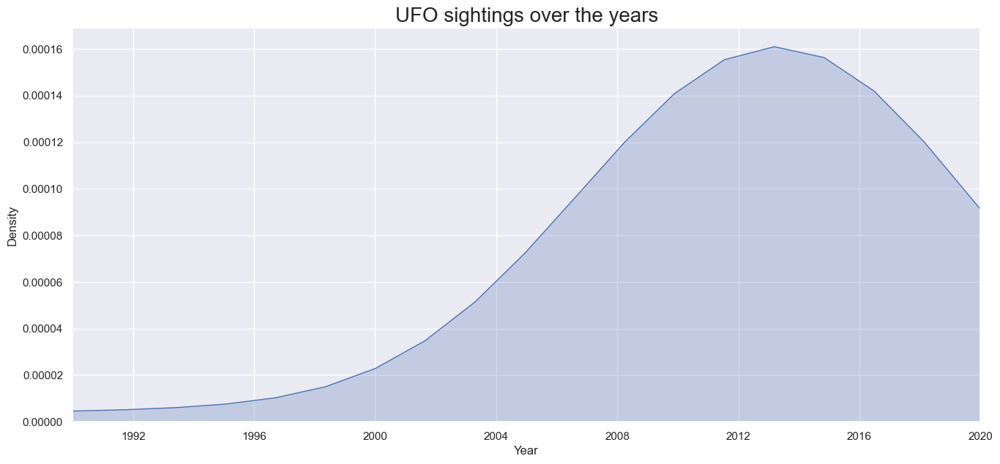

In [63]:
sns.set_theme(style='darkgrid')
plt.figure(figsize=(16, 7))

plt.xlim(pd.to_datetime("19900101"), pd.to_datetime("20200101"))

fig = sns.kdeplot(
    data=df_mod,
    x='date',
    fill=True,
    cumulative=False,
    bw_adjust=5.0  # Adjust this value to make the plot smoother; try higher for even more smoothness   (band width)
)
plt.title(
    'UFO sightings over the years',
    fontdict={
        'fontsize': 20
    }
)

plt.xlabel('Year')
plt.ylabel('Density')

# Show the plot
plt.show()

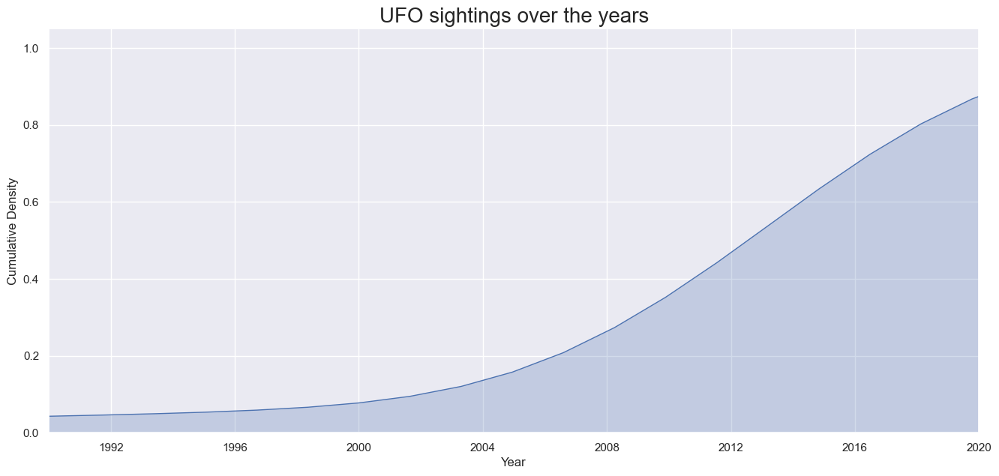

In [64]:
sns.set_theme(style='darkgrid')
plt.figure(figsize=(16, 7))

# Set the x-axis limits with datetime objects
plt.xlim(pd.to_datetime("19900101"), pd.to_datetime("20200101"))

# Create a KDE plot with a smoother curve
fig = sns.kdeplot(
    data=df_mod,
    x='date',
    fill=True,
    cumulative=True,
    bw_adjust=5.0  # Adjust this value to make the plot smoother; try higher for even more smoothness (band width)
)

# Set the title and other parameters
plt.title(
    'UFO sightings over the years',
    fontdict={'fontsize': 20}
)

plt.xlabel('Year')
plt.ylabel('Cumulative Density')

# Show the plot
plt.show()


In [65]:
df_mod.sort_values(by=['date'], ascending=True).head(5)

,summary,city,state,shape,duration,city_latitude,city_longitude,datetime,AM_PM,PM,AM,date,month,year
78812,Two white dots at high altitude traveling very...,Dallas,GA,unknown,1-2 minutes,33.912210,-84.880048,NaT,PM,1,0,1721-04-25,4.0,1721.0
34,Reported in a London paper in 1762: a bright l...,"Lulworth, Dorsetshire (near) (UK/England)",NaN,NaN,>1 minute,NaN,NaN,NaT,PM,1,0,1762-12-11,12.0,1762.0
72347,((HOAX)) FROM CAPT BLIGH LOG ON THE BOUNTY S...,Bounty (the ship),NaN,NaN,NaN,NaN,NaN,1988-05-04 01:00:00,PM,1,0,1788-05-04,5.0,1788.0
4860,"Slow Moving Fireball, stench of burning sulpher",Carlisle,NY,fireball,less than 1 minute,NaN,NaN,1990-06-30 21:00:00,PM,1,0,1790-06-30,6.0,1790.0
29417,UFO report communicated by Thomas Jefferson,Baton Rouge,LA,light,15 seconds,30.427367,-91.086956,2000-04-05 20:00:00,PM,1,0,1800-04-05,4.0,1800.0


###### <center>It seems that the earliest recorded UFO sightings<br>have been from the beginning of the 18th century.<br> **We even have a record of Thomas Jefferson**. <br> Most recorded UFO sightings<br>have been recorded after the year 2000 </center>
<hr>

#### <center> State Visualization </center>

###### <center> [Seaborn Color Palettes](https://www.practicalpythonfordatascience.com/ap_seaborn_palette) </center>
###### <center> [MORE Color Palettes](https://seaborn.pydata.org/tutorial/color_palettes.html) </center> <br><br>

<Axes: xlabel='count', ylabel='state'>

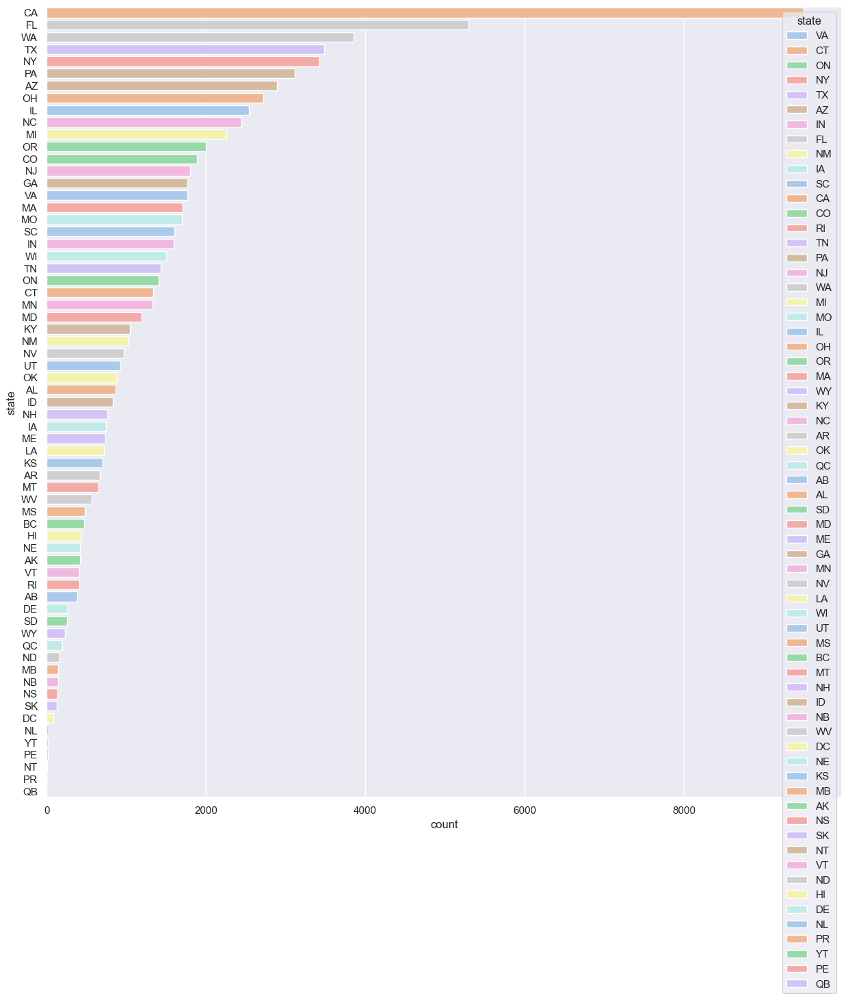

In [66]:
plt.figure(figsize=(15, 15))
sns.countplot(
    data=df_mod,
    y='state',
    order=df['state'].value_counts().index,
    hue = 'state',
    palette = "pastel"
)


#### <center> It seems that by far the most UFO sightings<br>happen in California, it would be interesting<br> for us to find out if this has always<br> been the case over the years or<br> if this is a recent development</center>

   state  count
6     CA   9506
11    FL   5294
60    WA   3856
56    TX   3481
41    NY   3425
46    PA   3115
4     AZ   2893
42    OH   2723
16    IL   2539
31    NC   2442


Text(0.5, 1.0, 'UFO sightings over the years by state')

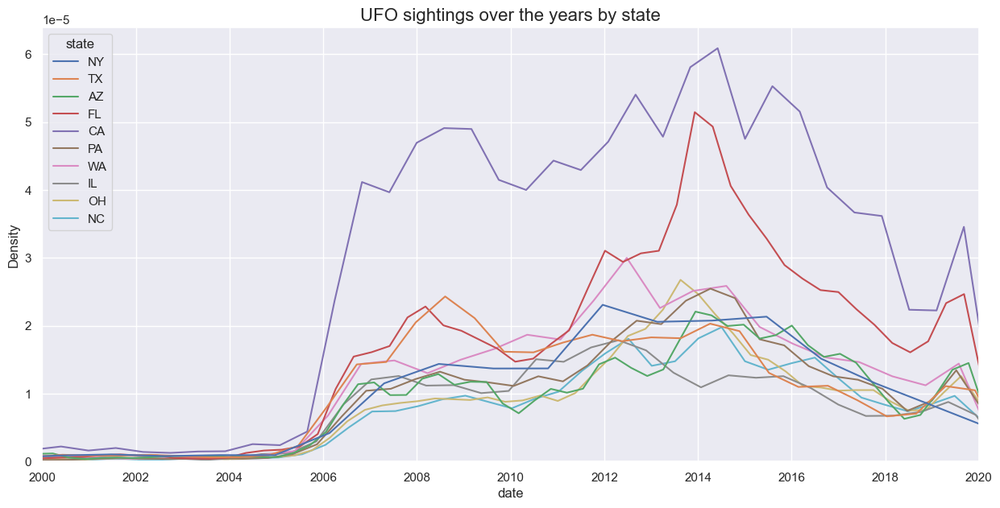

In [67]:
state_list = df_mod.groupby('state')['state'].count().reset_index(name='count').nlargest(10, columns=['count'])
print(state_list)
# print(type(state_list))

plt.figure(figsize=(15, 7))
plt.xlim(pd.to_datetime("20000101"), pd.to_datetime("20200101"))
# plt.xlim(pd.to_datetime("20000101", format='%Y%m%d'), pd.to_datetime("20200101", format='%Y%m%d'))

sns.kdeplot(
    data=df_mod[df['state'].isin(state_list['state'])],
    x='date',
    hue='state',
    bw_adjust=0.2,   # smoothing
)

plt.title(
    'UFO sightings over the years by state',
    fontdict={
        'fontsize': 16
    }
)

In [68]:
UFO_Yearly_Count = df_mod['year'].value_counts().sort_index()
print(UFO_Yearly_Count.tail(21))

year
1999.0     218
2000.0     240
2001.0     266
2002.0     225
2003.0     243
2004.0     341
2005.0     559
2006.0    3726
2007.0    4738
2008.0    5310
2009.0    4995
2010.0    4783
2011.0    5635
2012.0    8123
2013.0    7831
2014.0    8696
2015.0    6909
2016.0    5673
2017.0    5069
2018.0    3285
2019.0    5839
Name: count, dtype: int64


<br>Several smartphones with photograph capabilities were introduced<br>between 2003 and 2007. Here are some notable examples:<br>

2003<br>
Sony Ericsson P800: One of the early smartphones with a built-in camera,<br> running on the Symbian OS.<br>
Nokia 3650: Featured a VGA camera and was one of the first smartphones<br> to gain popularity with its unique circular keypad design.<br><hr>
2004<br>
Motorola Razr V3: Though primarily known for its design, it included a VGA camera.<br>
PalmOne Treo 600: Combined PDA functionality with a camera and was popular<br> among business users.<br><hr>
2005<br>
Nokia N70: Part of the Nokia Nseries, it featured a 2 MP camera and ran<br> on the Symbian OS.<br>
Sony Ericsson K750i: Came with a 2 MP camera and autofocus, which was quite advanced for its time.<br><hr>
2006<br>
BlackBerry Pearl 8100: BlackBerry's first device with a camera, featuring a 1.3 MP camera.<br>
Nokia N93: Known for its high-quality 3.2 MP camera with Carl Zeiss optics, capable of video recording.<br><hr>
2007
Apple iPhone: Introduced in January and released in June, it featured a 2 MP camera<br> and revolutionized the smartphone industry.<br>
Nokia N95: Featured a 5 MP camera with Carl Zeiss optics and was highly praised for<br> its camera capabilities.<br><hr>

These devices played a significant role in making mobile photography<br>more accessible to the general public, contributing to the increase in<br> captured and shared images, including UFO sightings.

# <center>**The <br> SIGHTINGS <br> Were Alway There**</center>
<hr>

#### <center> UFO Shape Visualization </center>

Text(0.5, 1.0, 'UFO sightings by shape')

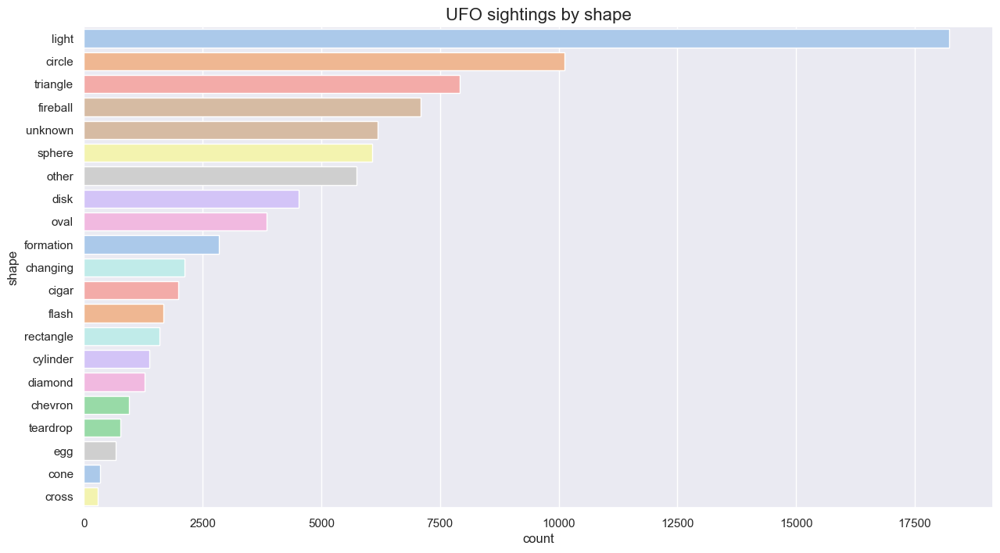

In [69]:
plt.figure(figsize=(15, 8))

sns.countplot(
    data=df,
    y='shape',
    order=df['shape'].value_counts().index,
    hue = 'shape',
    palette = "pastel",
    legend=False,
    stat='count'
)

plt.title(
    'UFO sightings by shape',
    fontdict={
        'fontsize': 16
    }
)


Text(0.5, 1.0, 'UFO sightings by shape')

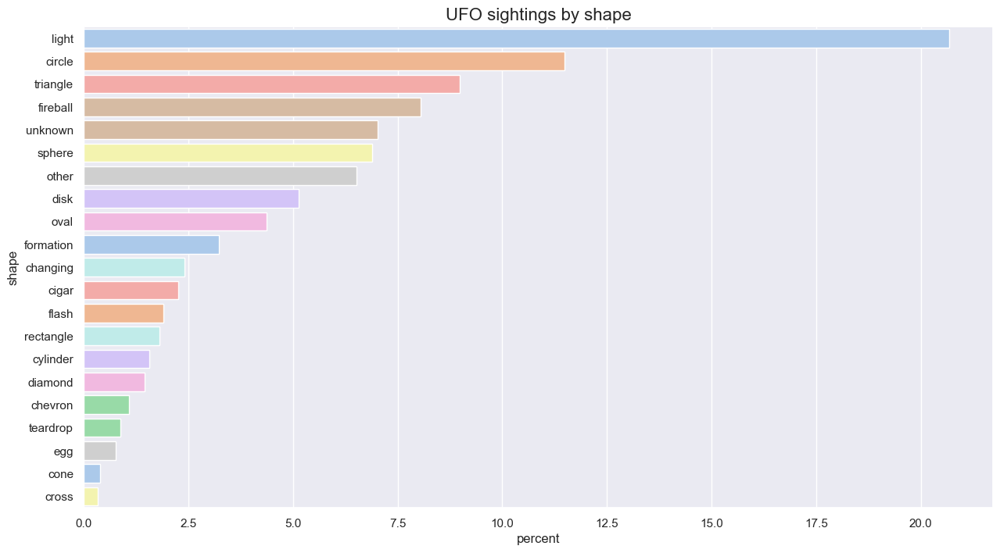

In [70]:
plt.figure(figsize=(15, 8))

sns.countplot(
    data=df,
    y='shape',
    order=df['shape'].value_counts().index,
    hue = 'shape',
    palette = "pastel",
    legend=False,
    stat='percent',
)

plt.title(
    'UFO sightings by shape',
    fontdict={
        'fontsize': 16
    }
)


        shape  count
13      light  18230
3      circle  10130
19   triangle   7910
10   fireball   7095
20    unknown   6182
17     sphere   6065
14      other   5749
8        disk   4522
15       oval   3857
12  formation   2842


Text(0.5, 1.0, 'UFO sightings over the years by shape')

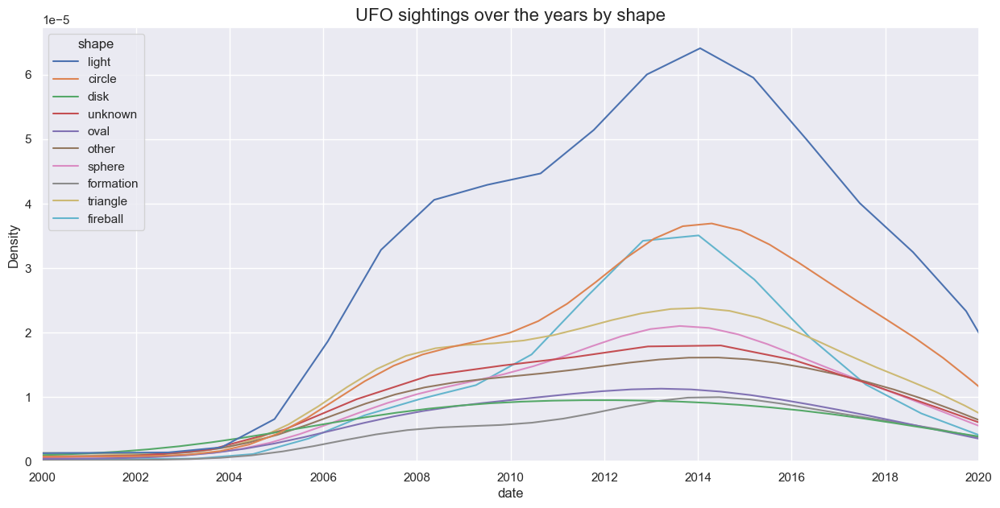

In [71]:
shape_list = df_mod.groupby('shape')['shape'].count().reset_index(name='count').nlargest(10, columns=['count'])
print(shape_list)

df_shape_list = df_mod[df_mod['shape'].isin(shape_list['shape'])]

plt.figure(figsize=(15, 7))

plt.xlim(pd.to_datetime("20000101"), pd.to_datetime("20200101"))

sns.kdeplot(
    # data=df_mod[df_mod['shape'].isin(shape_list['shape'])],
    data = df_shape_list,
    x='date',
    hue='shape'
)

plt.title(
    'UFO sightings over the years by shape',
    fontdict={
        'fontsize': 16
    }
)


It seems that most of the recorded UFO sightings consisted of a light and a circle shaped object.

month
1.0      6020
2.0      4581
3.0      5533
4.0      5857
5.0      6129
6.0      8759
7.0     10832
8.0      9130
9.0      8575
10.0     8458
11.0     7654
12.0     6554
Name: count, dtype: int64


C:\Users\fisch\AppData\Local\Temp\ipykernel_33676\645537507.py:15: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



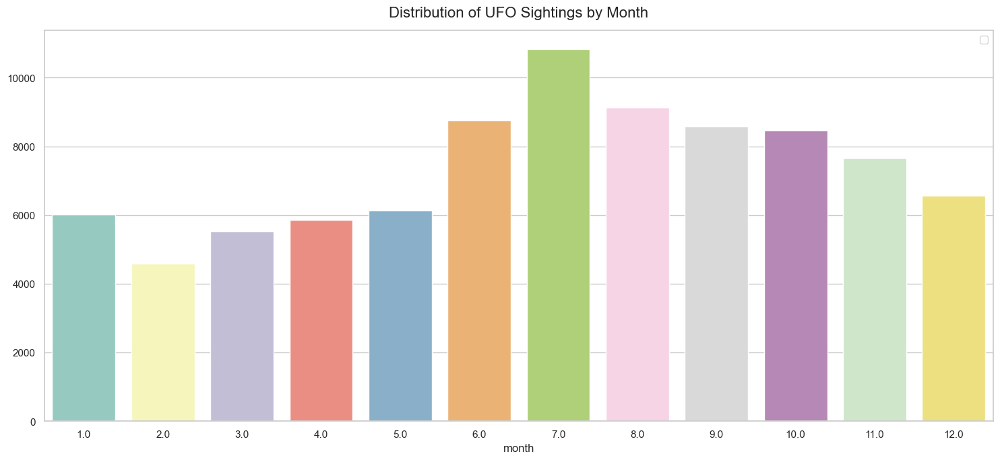

In [72]:
# Set Seaborn style and color palette
sns.set_theme(style="whitegrid", palette="viridis")


# Extract and analyze the distribution of sightings over different months
monthly_counts = df_mod['month'].value_counts().sort_index()
print(monthly_counts)

plt.figure(figsize=(15, 7))
sns.barplot(x=monthly_counts.index, y=monthly_counts.values, hue= monthly_counts.index, palette = "Set3", legend=False ) #, ax=axes[1])

plt.title('Distribution of UFO Sightings by Month', y=1.02, fontsize=16)

plt.tight_layout()
plt.legend(loc = 0)
plt.show()


### <center> Convert Numeric Month (1, 2, 3...)<br>to Text (Jan, Feb, Mar...) <center>

In [73]:
df_mod.columns

Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date', 'month',
       'year'],
      dtype='object')

In [74]:
# df_mod.to_csv('df_mod')

In [75]:
print(df_mod.columns, '\n')

month_map = {
    1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
    7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'
}

df_mod['month_name'] = df_mod['month'].map(month_map)

print(df_mod.columns)
print(df_mod.head())

Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date', 'month',
       'year'],
      dtype='object') 

Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date', 'month',
       'year', 'month_name'],
      dtype='object')
                                             summary        city state  \
0  My wife was driving southeast on a fairly popu...     Chester    VA   
1  I think that I may caught a UFO on the NBC Nig...  Rocky Hill    CT   
2  I woke up late in the afternoon 3:30-4pm. I we...         NaN   NaN   
3  I was driving towards the intersection of fall...      Ottawa    ON   
4  In Peoria Arizona, I saw a cigar shaped craft ...      Peoria    NY   

      shape     duration  city_latitude  city_longitude            datetime  \
0     light    5 seconds      37.343152      -77.408582 2019-12-12 18:43:00   
1    circ

#### <center> Interactive maps </center>

###### <center>Create a temporary dataframe with no missing values</center>

In [76]:
print("df_mod Rows & Columns",df_mod.shape)

df_temp = df_mod.copy()
df_temp = df_temp.dropna(subset=['date'])
df_temp['year'] = pd.DatetimeIndex(df_temp['date']).year

print("df_temp Rows & Columns",df_temp.shape)
print()
print(df_temp.columns)
print()
print(df_temp.head(2))

df_mod Rows & Columns (88125, 15)
df_temp Rows & Columns (88082, 15)

Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date', 'month',
       'year', 'month_name'],
      dtype='object')

                                             summary        city state  \
0  My wife was driving southeast on a fairly popu...     Chester    VA   
1  I think that I may caught a UFO on the NBC Nig...  Rocky Hill    CT   

    shape     duration  city_latitude  city_longitude            datetime  \
0   light    5 seconds      37.343152      -77.408582 2019-12-12 18:43:00   
1  circle  3-5 seconds      41.664800      -72.639300 2019-03-22 18:30:00   

  AM_PM  PM  AM       date  month  year month_name  
0    PM   1   0 2019-12-12   12.0  2019        Dec  
1    PM   1   0 2019-03-22    3.0  2019        Mar  


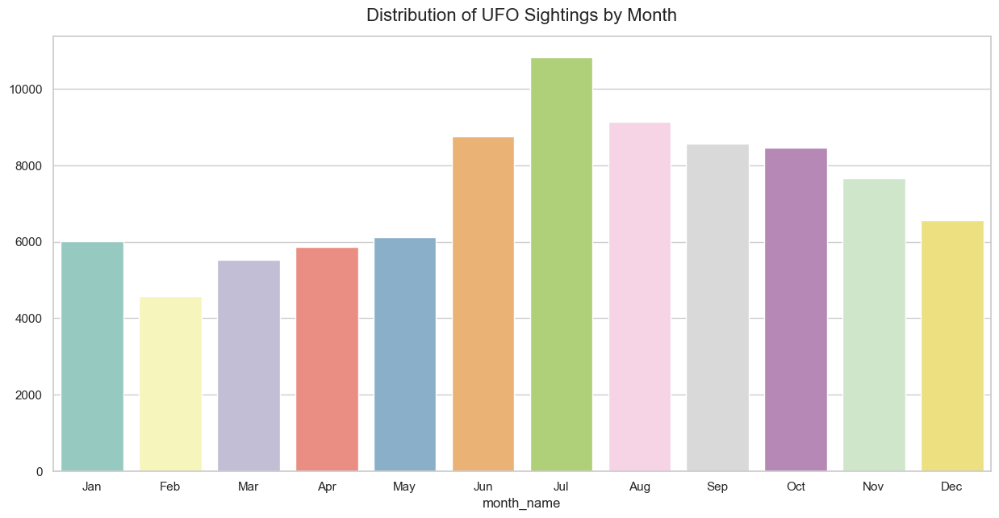

Jan 6020
Feb 4581
Mar 5533
Apr 5857
May 6129
Jun 8759
Jul 10832
Aug 9130
Sep 8575
Oct 8458
Nov 7654
Dec 6554

 total : 88082

71060
17065

AM_PM
True     71060
False    17065
Name: count, dtype: int64 AM_PM
False    71060
True     17065
Name: count, dtype: int64
Jul count: 10832


In [77]:
# Define the order of months
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Convert 'month_name' to a categorical type with the specified order
df_temp['month_name'] = pd.Categorical(df_temp['month_name'], categories=month_order, ordered=True)
# print(df_temp['month_name'].head())

# Get the value counts and ensure the index is ordered correctly
monthly_counts = df_temp['month_name'].value_counts().reindex(month_order)


# Plotting
sns.set_theme(style="whitegrid", palette="viridis")
plt.figure(figsize=(15, 7))
sns.barplot(x=monthly_counts.index, 
            y=monthly_counts.values, 
            palette="Set3", 
            hue = monthly_counts.index)

plt.title('Distribution of UFO Sightings by Month', y=1.02, fontsize=16)

plt.show()

total = 0
for month in month_order:
    print(month, int(monthly_counts[month]))
    total += int(monthly_counts[month])

print('\n','total :', total)
print()
print((df['AM_PM'] == "PM").sum())
print((df['AM_PM'] == "AM").sum())
print()


# AM = []
# PM = []
# for month in month_order:
#     AM.append(int(monthly_counts[month]))
#     PM.append(int(monthly_counts[month]))


PM = (df_mod['AM_PM'] == "PM").value_counts()
AM = (df_mod['AM_PM'] == "AM").value_counts()

print(PM, AM)


# PM_Jan = (df_mod['AM_PM'] == "PM" & df_mod['month_name'] == 'Jan').sum()
# print(PM_Jan)
# AM_month = (df_mod['AM_PM'] == "AM").sum()

print('Jul count:',(df_mod['month_name'] == 'Jul').sum())


Index(['summary', 'city', 'state', 'shape', 'duration', 'city_latitude',
       'city_longitude', 'datetime', 'AM_PM', 'PM', 'AM', 'date', 'month',
       'year', 'month_name'],
      dtype='object')


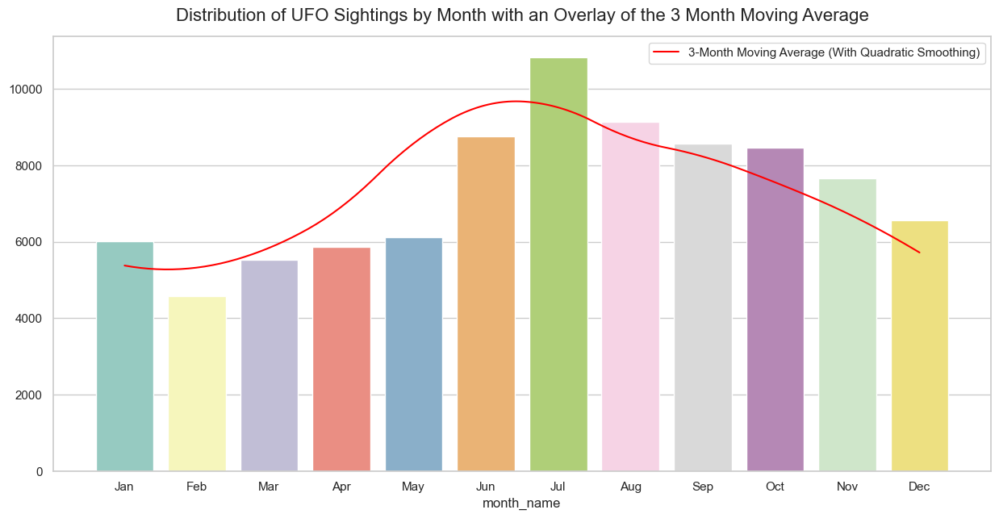

month_name
Jan     6020
Feb     4581
Mar     5533
Apr     5857
May     6129
Jun     8759
Jul    10832
Aug     9130
Sep     8575
Oct     8458
Nov     7654
Dec     6554
Name: count, dtype: int64
[5378, 5324, 5840, 6915, 8573, 9574, 9512, 8721, 8229, 7555, 6743, 5718]


In [78]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# from scipy.interpolate import make_interp_spline

def moving_average(sightings_data, num_months):
    n = len(sightings_data)
    moving_averages = []

    # Calculate the moving average
    for i in range(n):
        # Use modulo to wrap around to the beginning of the list
        window = [sightings_data[(i + j) % n] for j in range(num_months)]
        window_average = sum(window) / num_months
        # Round the average to the nearest whole number
        rounded_average = round(window_average)
        moving_averages.append(int(rounded_average)) 
    return moving_averages

# Assuming df_temp is already defined and 'month_name' is a valid column
print(df_temp.columns)

sns.set(style="whitegrid", palette="viridis")
'''
The function "set" is deprecated
  Function `set` is deprecated in favor of `set_theme` 
'''
# sns.set_theme(style="whitegrid", palette="viridis")

# Get the count of sightings by month
monthly_counts = df_temp['month_name'].value_counts().sort_index()


# Create the barplot
plt.figure(figsize=(15, 7))
sns.barplot(x=monthly_counts.index, y=monthly_counts.values, 
            palette="Set3", hue=monthly_counts.index)

plt.title('Distribution of UFO Sightings by Month with an Overlay of the 3 Month Moving Average', y=1.02, fontsize=16)

# Calculate the moving average
mov_avg = moving_average(monthly_counts.values, 3)

# Generate smooth line using make_interp_spline
x_vals = np.arange(len(monthly_counts.index))
spl = make_interp_spline(x_vals, mov_avg, k=2)  # k=2 quadratic spline
x_smooth = np.linspace(x_vals.min(), x_vals.max(), 200)  # 200 points between min and max
y_smooth = spl(x_smooth)

# Plot the smooth moving average line
plt.plot(x_smooth, y_smooth, color='red', label='3-Month Moving Average (With Quadratic Smoothing)')

# Add legend
plt.legend()

# Show plot
plt.show()

# Print results
print(monthly_counts)
# print(monthly_counts.values)
print(mov_avg)



In [79]:
fig = px.choropleth(
    df_temp.groupby(['state'])['state'].count().reset_index(name='Sightings'),
    locations='state',
    color='Sightings',
    color_continuous_scale='aggrnyl',
    locationmode = 'USA-states',
    height=700
)

fig.update_layout(
    title_text = 'Total UFO sightings by state',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

The Above graph shows us the total amount of UFO sightings by state, from the year 1721 to 2019. This clearly shows that most UFO recordings take place in California

In [80]:
# Drop rows with NaN values in 'city_latitude' or 'city_longitude'
df_temp = df_temp.dropna(subset=['city_latitude', 'city_longitude'])

# # Sort the DataFrame by year to ensure proper animation sequence
df_temp = df_temp.sort_values(by=['year'])

fig = px.scatter_geo(
    df_temp.sort_values(by=['year'],ascending=True),
    lat='city_latitude',
    lon='city_longitude',
    locationmode='USA-states',
    scope="usa",
    animation_frame="year",
    animation_group='state',
    height=700,
    title='ANIMATED: Recorded UFOs for a Given Year (not cumulative)'
)

fig.show()

The above graph shows us the exact location of the recorded UFO sightings per year. The graph paints a picture of the massive increase in sightings since the year 2000

###### Between 2003 and 2009, several social media platforms were launched that have since become well-known. Here are some of the notable ones:

###### 01) MySpace (2003): One of the earliest popular social networking sites, it allowed users to create profiles, connect with friends, and share music, photos, and blog posts.<br>02) LinkedIn (2003): A professional networking site that focuses on business and employment-oriented services, allowing users to create resumes, connect with colleagues, and seek job opportunities.<br>03) Facebook (2004): Initially launched for Harvard University students, Facebook quickly expanded to other universities and eventually became a global social networking platform, allowing users to connect, share posts, photos, and videos.<br>04) Flickr (2004): A photo-sharing and hosting service that became popular among photographers and bloggers for sharing and organizing images.

YouTube (2005): A video-sharing platform that allows users to upload, view, share, and comment on videos. It quickly became the largest video platform on the internet.

Reddit (2005): A social news aggregation, web content rating, and discussion website. Users can submit content such as links, text posts, and images, which can be upvoted or downvoted by other members.

Bebo (2005): A social networking site that was particularly popular in the UK, Ireland, and New Zealand. It allowed users to create profiles, share photos and videos, and send messages.

Twitter (2006): A microblogging platform where users can post and interact with messages known as "tweets." It became known for its real-time updates and was widely used for news and communication.

Tumblr (2007): A microblogging and social networking site where users can post multimedia content to a short-form blog. It became popular for its simplicity and creative freedom.

FriendFeed (2007): A real-time feed aggregator that allowed users to share content from other social media sites and blogs. It was eventually acquired by Facebook.

Pinterest (2009): A visual discovery and bookmarking platform that allows users to "pin" images, videos, and other content to virtual pinboards. It is often used for inspiration in various fields such as fashion, home decor, and cooking.

These platforms played significant roles in shaping the social media landscape and continue to influence how people connect and share content online.


In [81]:
# link for documentation of KWAs plotly.express.scatter_geo()
# https://plotly.com/python-api-reference/generated/plotly.express.scatter_geo

# # Drop rows with NaN values in 'city_latitude' or 'city_longitude'
df_temp = df_temp.dropna(subset=['city_latitude', 'city_longitude'])

# # Sort the DataFrame by year to ensure proper animation sequence
df_temp = df_temp.sort_values(by=['year'])

# Create the scatter_geo plot with animation
fig = px.scatter_geo(
    data_frame=df_temp,
    lat='city_latitude',
    lon='city_longitude',
    locationmode='USA-states',
    scope="usa",
    animation_frame="year",
    animation_group='state',
    height=700,
    title='ANIMATED: Recorded UFOs for a Given Year (not cumulative)'
)

# # Update layout for better appearance and clarity
# fig.update_layout(
#     title_text='ANIMATED: Recorded UFOs for a Given Year (not cumulative)',
#     showlegend=True,
#     geo=dict(
#         scope="usa",
#         showland=True,
#         landcolor="rgb(128, 128, 128)",
#         showocean=True,
#         oceancolor="rgb(204, 204, 255)"
#     ),
#     sliders=dict(
#         active=0,
#         steps=[
#             dict(
#                 method='animate',
#                 args=[['{year}'.format(year=y)], dict(mode='immediate', frame=dict(duration=300, redraw=True), fromcurrent=True)],
#                 label=str(y)
#             ) for y in df_temp['year'].unique()
#         ]
#     )
# )

# Show the plot
fig.show()


<hr>
<hr>

# [WordCloud Style Guide](https://kristendavis27.medium.com/wordcloud-style-guide-2f348a03a7f8)

7134358 



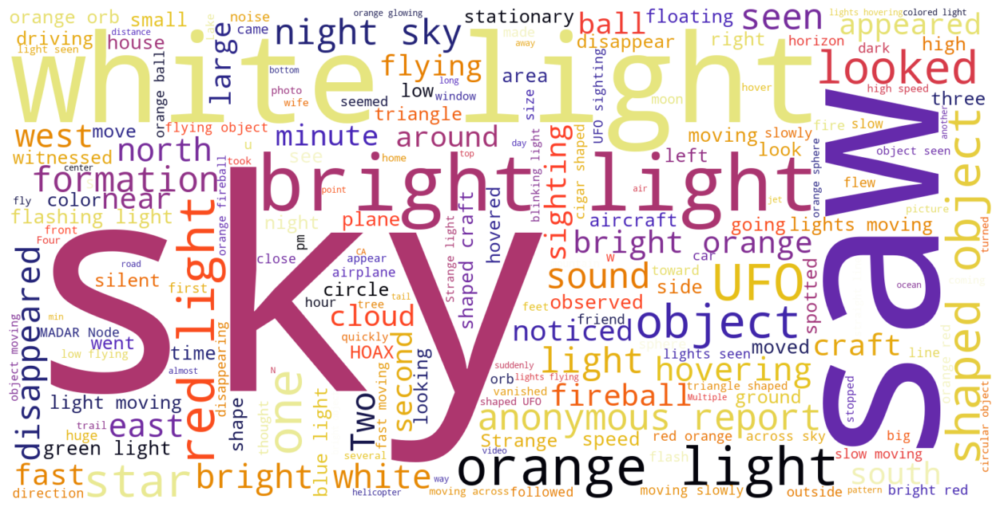

In [86]:
text = " ".join(df_mod['summary'])
wordcloud = WordCloud(
    background_color="white",
    width=1600,     # width=1600,
    height=800,     # height=800
    stopwords = STOPWORDS.update(["NUFORC", "Note"]),       # there are 194 words in 'stopwords' (192 + 2)
    colormap = "CMRmap_r", 
).generate(text)

print(len(text), '\n')

# Extract and list the words and their frequencies
word_frequencies = wordcloud.words_

# print(wordcloud.words_)

# Print the words and their frequencies
# for word, freq in word_frequencies.items():
#     print(f"Word: {word: <18} Relative Frequency ... Size: {freq: .20f}")


plt.figure(figsize=(16, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.show()

# <center>The Above WORDCLOUD<br>Paints a Picture<br>of the Summary<br>of ALL the Recorded<br>UFO Sightings in the USA.<br>(Nearly 90,000 Sightings)</center>

In [83]:
# df.info

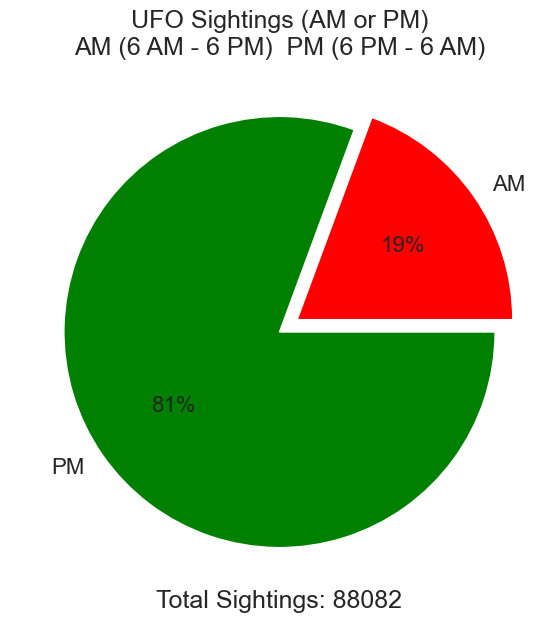

In [84]:

am_count = df_mod.groupby('month_name', 
                          observed=False)['AM'].apply(lambda x: (x == 1).sum()).sum()
pm_count = df_mod.groupby('month_name', 
                          observed=False)['PM'].apply(lambda x: (x == 1).sum()).sum()

total_count = am_count + pm_count

df_temp = [am_count, pm_count] 
keys = ['AM', 'PM'] 

plt.figure(figsize=(7, 7))
  
# define Seaborn color palette to use 
palette_color = sns.color_palette(('red', 'green')) 
  
# plotting data on chart 
plt.rcParams.update({'axes.labelsize': 30})
plt.pie(df_temp, labels=keys, colors=palette_color, explode=[0.1, 0], autopct='%.0f%%', 
        textprops={'fontsize': 16}) 
  
plt.title(f'UFO Sightings (AM or PM){'\n'}AM (6 AM - 6 PM)  PM (6 PM - 6 AM)', fontsize=18)
plt.text(0, -1.25,f'Total Sightings: {total_count}', ha='center', va='center', fontsize=18)

# displaying chart 
plt.show() 

<Figure size 1600x900 with 0 Axes>

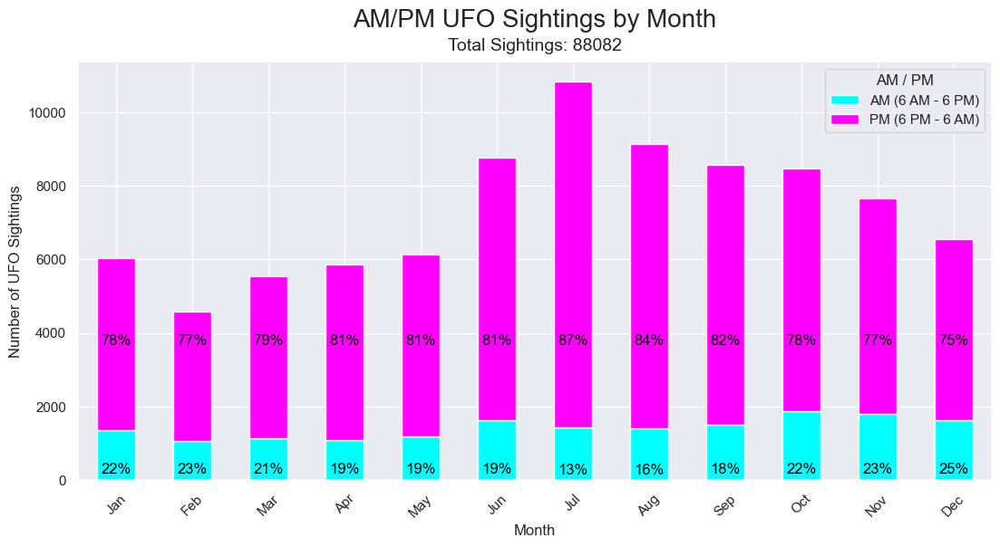

In [85]:
# https://chatgpt.com/share/66f7136b-4494-8011-ab18-13cc6fe27b3f

# print(df_temp.columns)

sns.set_theme(style='darkgrid')
plt.figure(figsize=(16, 9))

# Define correct order of months
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
               'Oct', 'Nov', 'Dec']

# Convert 'month' column to categorical with correct order
df_mod['month_name'] = pd.Categorical(df_mod['month_name'], 
                                      categories=month_order, ordered=True)

# Group by month and calculate rain frequency
am_count = df_mod.groupby('month_name', 
                          observed=False)['AM'].apply(lambda x: (x == 1).sum())
pm_count = df_mod.groupby('month_name', 
                          observed=False)['PM'].apply(lambda x: (x == 1).sum())

# Combine the counts into a DataFrame
df_am_pm = pd.DataFrame({
    'AM': am_count,
    'PM': pm_count
})

# print(am_count)
# print(pm_count)
# print(am_pm_freq)

# Create a stacked bar plot
df_am_pm.plot(kind='bar', stacked=True, color=['cyan', 'magenta'], figsize=(13, 6))


# Calculate total and percentages
total = df_am_pm.sum(axis=1)
percentages_am = df_am_pm['AM'] / total * 100
percentages_pm = df_am_pm['PM'] / total * 100

# Add percentages to the plot
for i, (p_am, p_pm) in enumerate(zip(percentages_am, percentages_pm)):
    plt.text(i, p_am +  450, f'{p_am:.0f}%', ha='center', va='top', 
             color='black', fontsize=12)
    plt.text(i, p_am + p_pm + 3500, f'{p_pm:.0f}%', ha='center', va='bottom', 
             color='black', fontsize=12)


# Add labels and title
plt.xlabel('Month')
plt.ylabel('Number of UFO Sightings')
plt.title(f'AM/PM UFO Sightings by Month{'\n'}', fontsize=20)
plt.xticks(rotation=45)
plt.legend(title = 'AM / PM', labels = ['AM (6 AM - 6 PM)', 'PM (6 PM - 6 AM)'])

plt.text(5.5, 11800,f'Total Sightings: {total_count}', ha='center', va='center', fontsize=14)

# Show the plot
plt.show()

